# Test XGBoost Classification Model Hyperparamter Optimization
#### Using RandomCV & GridSearchCV & Pipiline & without_pipeline & PCA

#### Coded by : Loh Khai Shyang



In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import xgboost as xgb
import pandas_profiling
from ipynb.fs.full.data_cleaning_function import data_cleaning,imbalance_data_check,numeric_histogram_plot_for_classification_model
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix,plot_confusion_matrix


# 1. Exploratory Data Analysis (EDA)

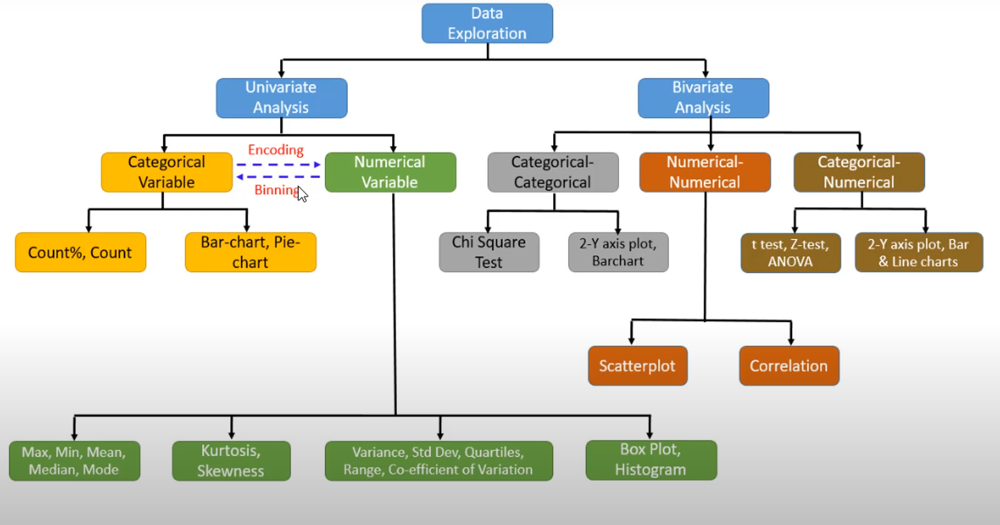

#### Barplot add Text
#### link : https://moonbooks.org/Articles/How-to-add-text-on-a-bar-with-matplotlib-/


In [2]:
df=pd.read_csv('Telco_customer_churn.csv')
df.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


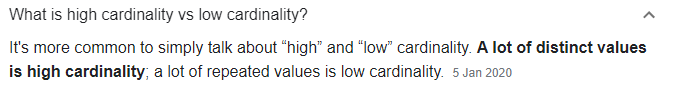

In [3]:
pandas_profiling.ProfileReport(pd.read_csv('Telco_customer_churn.csv'))

Summarize dataset:   0%|          | 0/46 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df=data_cleaning(df,0)


Data Cleaning Report - Basic Data Informations

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   int64  
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   int64  
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043

#### Overall Data View after Data Cleaning Function

In [5]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/43 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Remove unused / High Cardinality / High Correlation with Label Features

In [6]:
remove_column = ['CustomerID','Lat_Long','Churn_Label','Churn_Score','CLTV','Churn_Reason']

categorical_column=['City',
                    'Gender',
                    'Senior_Citizen',
                    'Partner',
                    'Dependents',
                    'Phone_Service',
                    'Multiple_Lines',
                    'Internet_Service',
                    'Online_Security',
                    'Online_Backup',
                    'Device_Protection',
                    'Tech_Support',
                    'Streaming_TV',
                    'Streaming_Movies',
                    'Contract',
                    'Paperless_Billing',
                    'Payment_Method']

df.drop(remove_column,axis=1,inplace=True)
df.head()

,City,Zip_Code,Latitude,Longitude,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,...,Device_Protection,Tech_Support,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value
0,Los_Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed_check,53.85,108.15,1
1,Los_Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic_check,70.70,151.65,1
2,Los_Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic_check,99.65,820.5,1
3,Los_Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic_check,104.80,3046.05,1
4,Los_Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Bank_transfer_(automatic),103.70,5036.3,1


### We can see that label data is imbalance data


 Imbalance Data Check - Frequency Table of Label Data :
    Churn_Value  Count
0            0   5174
1            1   1869 

Imbalance Data Check - Label Data Distribution % :
           0          1
0  73.463013  26.536987

Imbalance Data Check - Data Distribution % Summary Plot :



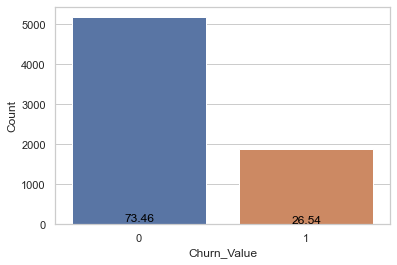

In [7]:
# Called function to check imbalance data and visualize
imbalance_data_check(df,'Churn_Value')

## Data Analysis - Outlier Data

#### Univariate Analysis ( Numerical Data)

<Figure size 432x288 with 0 Axes>

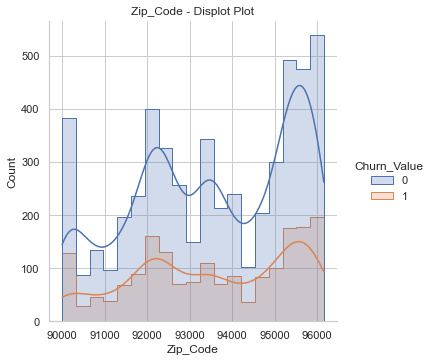

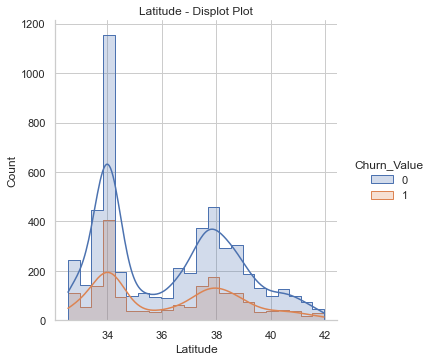

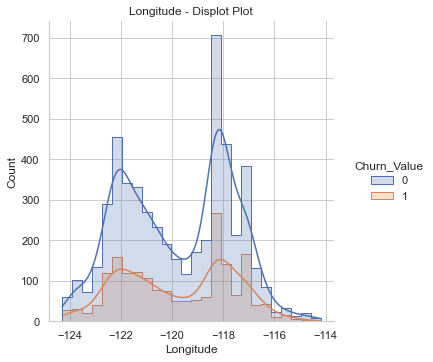

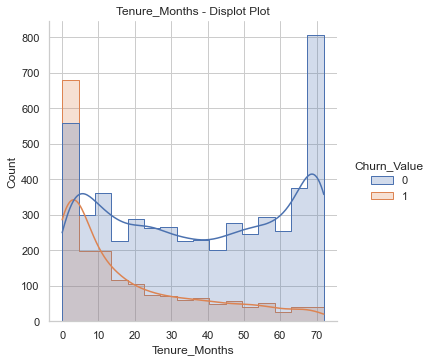

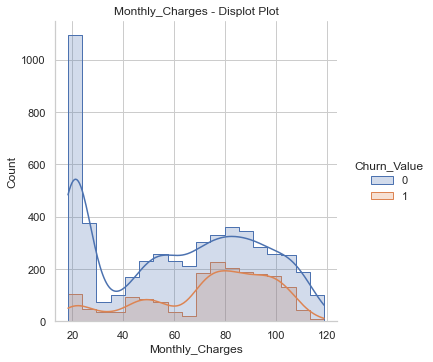

In [8]:
numeric_histogram_plot_for_classification_model(df,"Churn_Value",False)

#### MultiVariate Analysis ( Numerical Data )

C:\Users\User\.conda\envs\tf2.4\lib\site-packages\seaborn\axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


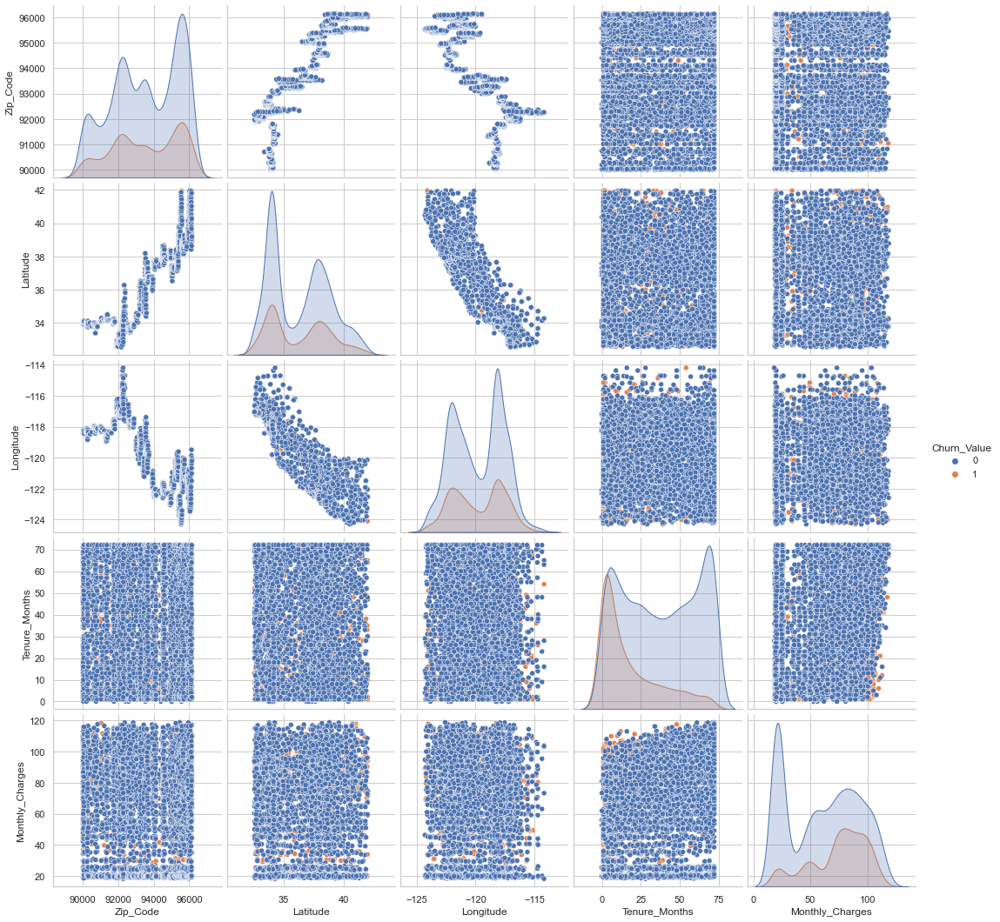

In [9]:
sns.pairplot(df,hue='Churn_Value',size=3)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   City               7043 non-null   object 
 1   Zip_Code           7043 non-null   int64  
 2   Latitude           7043 non-null   float64
 3   Longitude          7043 non-null   float64
 4   Gender             7043 non-null   object 
 5   Senior_Citizen     7043 non-null   object 
 6   Partner            7043 non-null   object 
 7   Dependents         7043 non-null   object 
 8   Tenure_Months      7043 non-null   int64  
 9   Phone_Service      7043 non-null   object 
 10  Multiple_Lines     7043 non-null   object 
 11  Internet_Service   7043 non-null   object 
 12  Online_Security    7043 non-null   object 
 13  Online_Backup      7043 non-null   object 
 14  Device_Protection  7043 non-null   object 
 15  Tech_Support       7043 non-null   object 
 16  Streaming_TV       7043 

## 4. Data Cleaning


### Anomaly and Outlier Detection 

## 5. Data Preparation for model Training


## Without Pipeline
#### Imbalance data split

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   City               7043 non-null   object 
 1   Zip_Code           7043 non-null   int64  
 2   Latitude           7043 non-null   float64
 3   Longitude          7043 non-null   float64
 4   Gender             7043 non-null   object 
 5   Senior_Citizen     7043 non-null   object 
 6   Partner            7043 non-null   object 
 7   Dependents         7043 non-null   object 
 8   Tenure_Months      7043 non-null   int64  
 9   Phone_Service      7043 non-null   object 
 10  Multiple_Lines     7043 non-null   object 
 11  Internet_Service   7043 non-null   object 
 12  Online_Security    7043 non-null   object 
 13  Online_Backup      7043 non-null   object 
 14  Device_Protection  7043 non-null   object 
 15  Tech_Support       7043 non-null   object 
 16  Streaming_TV       7043 

In [34]:
df

,City,Zip_Code,Latitude,Longitude,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,...,Device_Protection,Tech_Support,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value
0,Los_Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed_check,53.85,108.15,1
1,Los_Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic_check,70.70,151.65,1
2,Los_Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic_check,99.65,820.5,1
3,Los_Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic_check,104.80,3046.05,1
4,Los_Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Bank_transfer_(automatic),103.70,5036.3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,Landers,92285,34.341737,-116.539416,Female,No,No,No,72,Yes,...,No_internet_service,No_internet_service,No_internet_service,No_internet_service,Two_year,Yes,Bank_transfer_(automatic),21.15,1419.4,0
7039,Adelanto,92301,34.667815,-117.536183,Male,No,Yes,Yes,24,Yes,...,Yes,Yes,Yes,Yes,One_year,Yes,Mailed_check,84.80,1990.5,0
7040,Amboy,92304,34.559882,-115.637164,Female,No,Yes,Yes,72,Yes,...,Yes,No,Yes,Yes,One_year,Yes,Credit_card_(automatic),103.20,7362.9,0
7041,Angelus_Oaks,92305,34.167800,-116.864330,Female,No,Yes,Yes,11,No,...,No,No,No,No,Month-to-month,Yes,Electronic_check,29.60,346.45,0


### Split Train and Test dataset

In [39]:
X=df.drop('Churn_Value',axis=1)
Y=df['Churn_Value']

In [41]:
X_train,x_test,Y_train,y_test=train_test_split(X,Y,random_state=42,stratify=Y)

#### train and test dataset is contains balanced class

In [42]:
#imbalance_data_check(Y_train,'Churn_Value')
print(sum(Y_train)/len(Y_train))
print(sum(y_test)/len(y_test))

0.2654297614539947
0.26519023282226006


### One Hot Encoder
#### 'Total_Charges' although its object but its int will not inlcude in get dummies

In [50]:
ohe_columns=X_train.select_dtypes(include=['object']).columns
ohe_columns=['City', 'Gender', 'Senior_Citizen', 'Partner', 'Dependents',
       'Phone_Service', 'Multiple_Lines', 'Internet_Service',
       'Online_Security', 'Online_Backup', 'Device_Protection', 'Tech_Support',
       'Streaming_TV', 'Streaming_Movies', 'Contract', 'Paperless_Billing',
       'Payment_Method']
ohe_columns

['City',
 'Gender',
 'Senior_Citizen',
 'Partner',
 'Dependents',
 'Phone_Service',
 'Multiple_Lines',
 'Internet_Service',
 'Online_Security',
 'Online_Backup',
 'Device_Protection',
 'Tech_Support',
 'Streaming_TV',
 'Streaming_Movies',
 'Contract',
 'Paperless_Billing',
 'Payment_Method']

In [51]:
ohe=OneHotEncoder(sparse=False)
X_train_encoded=ohe.fit_transform(X_train[ohe_columns])

AttributeError: 'numpy.ndarray' object has no attribute 'head'

### Feature Value Normalization

In [52]:
norm_columns=X_train.select_dtypes(include=['int32','int64','float64']).columns
norm_columns=np.append(norm_columns,'Total_Charges')
norm_columns

array(['Zip_Code', 'Latitude', 'Longitude', 'Tenure_Months',
       'Monthly_Charges', 'Total_Charges'], dtype=object)

In [53]:
ss=StandardScaler()
X_train_norm=ss.fit_transform(X_train[norm_columns])
X_train_norm

array([[-1.85045669, -0.90861463,  0.74696016,  1.60960809, -0.37146069,
         0.65293105],
       [ 1.30250537,  1.40141686, -1.03812676, -1.15178048, -0.62503158,
        -0.91839261],
       [-0.47746166, -1.070481  ,  0.86850521,  0.9598696 , -1.44706533,
        -0.46103082],
       ...,
       [ 1.11187111,  1.57911702, -1.67449069,  1.56899943,  1.47148594,
         2.37012207],
       [ 0.76487393,  0.74330981, -1.31215016, -0.33960737, -1.47358254,
        -0.79182543],
       [-0.13474839, -0.05702804,  0.31014237, -1.07056317, -1.46529591,
        -0.95528616]])

In [54]:
X_train_model=pd.DataFrame(np.concatenate([X_train_encoded,
                                           X_train_norm],
                                          axis=1))

In [55]:
X_train_model.head()


,0,1,2,3,4,5,6,7,8,9,...,1166,1167,1168,1169,1170,1171,1172,1173,1174,1175
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,-1.850457,-0.908615,0.746960,1.609608,-0.371461,0.652931
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.302505,1.401417,-1.038127,-1.151780,-0.625032,-0.918393
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,-0.477462,-1.070481,0.868505,0.959870,-1.447065,-0.461031
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,-0.956725,-0.896342,0.825923,0.959870,0.980917,1.239639
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,-1.847244,-0.888509,0.656331,-0.948737,0.487034,-0.686528


## 6-1. Model Hyper parameter Tuning ( Without Pipeline )

#### GridseachCV  

In [59]:
param_grid_1={
    'max_depth':[3,4,5],
    'learning_rate':[0.1,0.01,0.05],
    'gamma':[0,0.25,1.0],
    'reg_lambda':[0,1.0,10.0],
    'scale_pos_weight':[1,3,5]
}

In [61]:
# Hyper Parameter Tuning GridSearchCV ( without pipeline ) Run 1

xgb_clf=xgb.XGBClassifier(objective='binary:logistic',
                          seed=42,
                          subsample=1, #  each subset of dataset use to build each tree only use 0.9 = 90% of random original dataset
                          colsample_bytree=1) # each tree use how many column to build 0.5 = 50% of original dataset column

optimal_params_gridsearchcv_1 = GridSearchCV(estimator = xgb_clf,\
                                             param_grid = param_grid_1,
                                             scoring='roc_auc',
                                             verbose=2,  # if you want to see what grid search is doing, set verbose =2
                                             n_jobs=10,
                                             cv=3,)
optimal_params_gridsearchcv_1

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None, colsample_bytree=1,
                                     gamma=None, gpu_id=None,
                                     importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, seed=42,
                                     subsample=1, tree_method=No

In [62]:
optimal_params_gridsearchcv_1.fit(X_train_model,
                                  Y_train,
                                  early_stopping_rounds=10,
                                  eval_metric='auc',
                                  eval_set=[(x_test,y_test)],
                                  verbose=False)

Fitting 3 folds for each of 243 candidates, totalling 729 fits


C:\Users\User\.conda\envs\tf2.4\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan na

ValueError: DataFrame.dtypes for data must be int, float, bool or categorical.  When
                categorical type is supplied, DMatrix parameter
                `enable_categorical` must be set to `True`.City, Gender, Senior_Citizen, Partner, Dependents, Phone_Service, Multiple_Lines, Internet_Service, Online_Security, Online_Backup, Device_Protection, Tech_Support, Streaming_TV, Streaming_Movies, Contract, Paperless_Billing, Payment_Method, Total_Charges

#### RandomizeSearchCV

## 6-2. Model Hyper parameter Tuning ( With Pipeline )

## 7. Model Evaluation Metric